<a href="https://colab.research.google.com/github/VachanPatil30/Global-Terrorism-Analysis/blob/main/Global_terrorrism.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <font color=7E4456>EAS 503 - Python</font>
### <font color=155E64>Final Project - Global Terrorism Data</font>

## 1. Importing Libraries and Loading Data

In [1]:
# Import required modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as pltg
import seaborn as sns
import math
import io

In [3]:
from google.colab import files
uploaded = files.upload()


Saving globalterrorismdb_0718dist.csv to globalterrorismdb_0718dist.csv


In [4]:
df = pd.read_csv(io.BytesIO(uploaded['globalterrorismdb_0718dist.csv']),encoding='ISO-8859-1')

<ipython-input-4-9751ba79bec8>:1: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(io.BytesIO(uploaded['globalterrorismdb_0718dist.csv']),encoding='ISO-8859-1')


In [5]:
df.head(5)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [6]:
# Renaming the columns and using only those columns that are useful for visualisation
df.rename(columns={'eventid':'EventId','iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'State',
                   'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                   'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                   'weaptype1_txt':'Weapon_type','motive':'Motive','city':'City'},inplace=True)

df=df[['EventId','Year','Month','Day','Country','State','Region','City','latitude','longitude','AttackType',
             'Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   EventId      181691 non-null  int64  
 1   Year         181691 non-null  int64  
 2   Month        181691 non-null  int64  
 3   Day          181691 non-null  int64  
 4   Country      181691 non-null  object 
 5   State        181270 non-null  object 
 6   Region       181691 non-null  object 
 7   City         181257 non-null  object 
 8   latitude     177135 non-null  float64
 9   longitude    177134 non-null  float64
 10  AttackType   181691 non-null  object 
 11  Killed       171378 non-null  float64
 12  Wounded      165380 non-null  float64
 13  Target       181055 non-null  object 
 14  Summary      115562 non-null  object 
 15  Group        181691 non-null  object 
 16  Target_type  181691 non-null  object 
 17  Weapon_type  181691 non-null  object 
 18  Motive       50561 non-n

Adding Casualities Column

In [8]:
df['Wounded']=df['Wounded'].fillna(0).astype(int)
df['Killed']=df['Killed'].fillna(0).astype(int)
df['casualities'] = df['Killed']+ df['Wounded']
df.head(5)

,EventId,Year,Month,Day,Country,State,Region,City,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,197000000001,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1,0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1
1,197000000002,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0,0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0
2,197001000001,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1,0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1
3,197001000002,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,0,0,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,0
4,197001000003,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,0,0,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,0


# Data Exploration

## Top 5 Countries with terrorist attacks

In [9]:
for i in range(0,5):
    print(f"{i+1}. {df.Country.value_counts().index[i]} with {df.Country.value_counts()[i]} attacks")

1. Iraq with 24636 attacks
2. Pakistan with 14368 attacks
3. Afghanistan with 12731 attacks
4. India with 11960 attacks
5. Colombia with 8306 attacks


## Top 5 Regions with terrorist attacks

In [10]:
for i in range(0,5):
    print(f"{i+1}. {df.Region.value_counts().index[i]} with {df.Region.value_counts()[i]} attacks.")


1. Middle East & North Africa with 50474 attacks.
2. South Asia with 44974 attacks.
3. South America with 18978 attacks.
4. Sub-Saharan Africa with 17550 attacks.
5. Western Europe with 16639 attacks.


## Basic Analysis of dataset

In [11]:
print(df['Year'].value_counts().idxmax(),'is the most attacked year with', df['Year'].value_counts().max(),'attacks')
print('The most attacked month is the',df['Month'].value_counts().idxmax(),'th month with',df['Month'].value_counts().max(),'attacks')
print(df['Group'].value_counts().index[1],'is the most attacked group with',df['Group'].value_counts().max(),'attacks')
print(df['AttackType'].value_counts().idxmax(),'is the most common type of attack')

2014 is the most attacked year with 16903 attacks
The most attacked month is the 5 th month with 16875 attacks
Taliban is the most attacked group with 82782 attacks
Bombing/Explosion is the most common type of attack


##  Heatmap to graphically represent the correlation of data

In [12]:
df.corr()

<ipython-input-12-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,EventId,Year,Month,Day,latitude,longitude,Killed,Wounded,casualities
EventId,1.000000,0.999996,0.002706,0.018336,0.166886,0.003907,0.021263,0.017492,0.020684
Year,0.999996,1.000000,0.000139,0.018254,0.166933,0.003917,0.021252,0.017484,0.020675
Month,0.002706,0.000139,1.000000,0.005497,-0.015978,-0.003880,0.004031,0.003178,0.003805
Day,0.018336,0.018254,0.005497,1.000000,0.003423,-0.002285,-0.003225,-0.001082,-0.001808
latitude,0.166886,0.166933,-0.015978,0.003423,1.000000,0.001463,-0.013170,0.015921,0.009899
longitude,0.003907,0.003917,-0.003880,-0.002285,0.001463,1.000000,-0.000587,0.000205,0.000013
Killed,0.021263,0.021252,0.004031,-0.003225,-0.013170,-0.000587,1.000000,0.443326,0.651885
Wounded,0.017492,0.017484,0.003178,-0.001082,0.015921,0.000205,0.443326,1.000000,0.968724
casualities,0.020684,0.020675,0.003805,-0.001808,0.009899,0.000013,0.651885,0.968724,1.000000


<ipython-input-15-f9afc3ca0442>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True,vmin=-1, vmax=1, linewidths=4,cmap=sns.diverging_palette(240, 10, n=10));


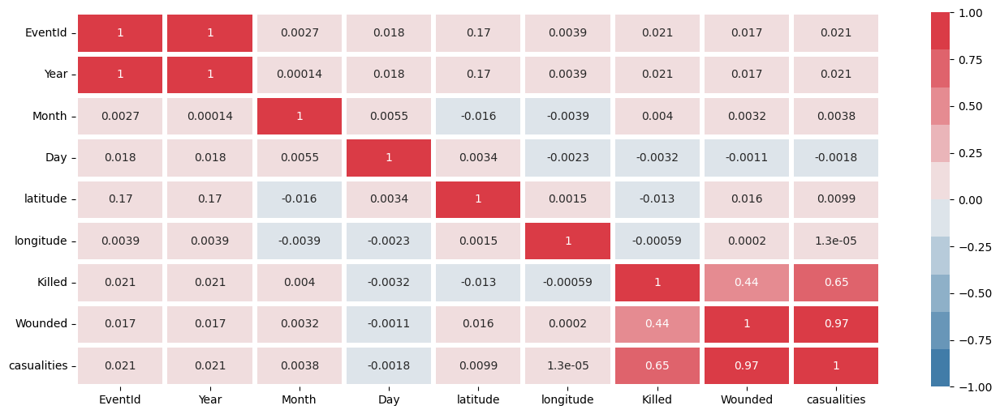

In [15]:
# Graphical representation of the above correlation
#darker the color higher is the magnitude of that phenomenon to occur.
import matplotlib.pyplot as plt
plt.figure(figsize=(16, 6))
sns.heatmap(df.corr(),annot=True,vmin=-1, vmax=1, linewidths=4,cmap=sns.diverging_palette(240, 10, n=10));

##  Terrorist Activities over the years

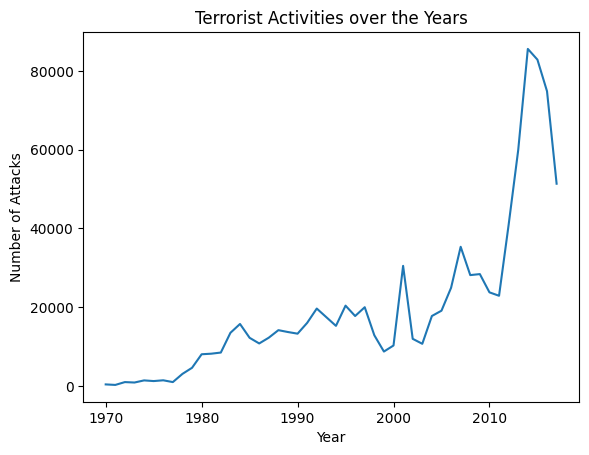

In [16]:
# prompt: Terrorist Activities over the years y axis is number of attacks

df.groupby(['Year'])['casualities'].sum().plot()
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.title('Terrorist Activities over the Years')
plt.show()


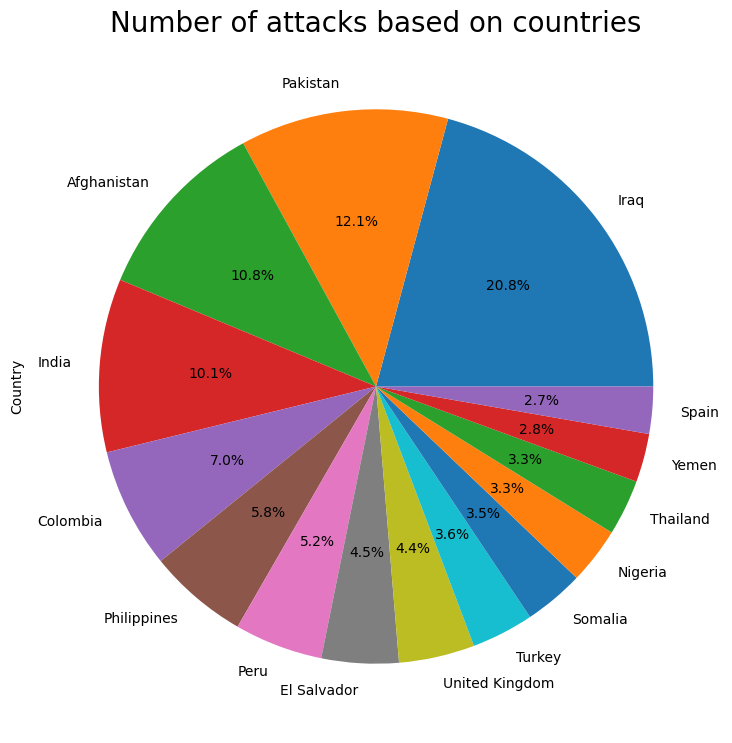

In [17]:
plt.figure(figsize=(9,9))
df['Country'].value_counts()[:15].plot(kind='pie',autopct='%1.1f%%')
plt.title('Number of attacks based on countries', size=20)
plt.show()

<ipython-input-18-e5194f7cc166>:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x = cas.Year, y =cas.casualities, data=df, palette="rocket_r",ci = None)


Text(0.5, 1.0, 'Casualities Over The Year')

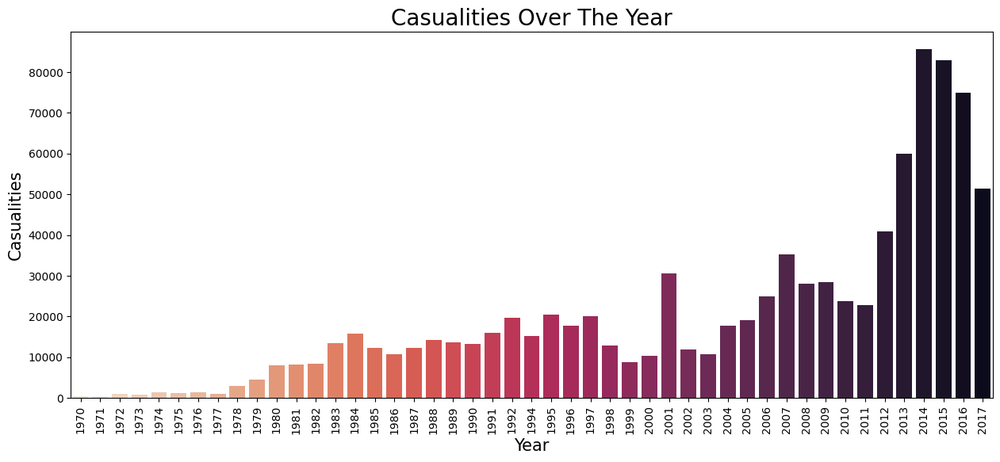

In [18]:
plt.subplots(figsize=(15,6))
cas = df.groupby('Year').casualities.sum().to_frame().reset_index()
cas.columns = ['Year','casualities']
sns.barplot(x = cas.Year, y =cas.casualities, data=df, palette="rocket_r",ci = None)
plt.xlabel("Year", size=15)
plt.ylabel("Casualities", size=15)
plt.xticks(rotation=90)
plt.title('Casualities Over The Year',size=20)

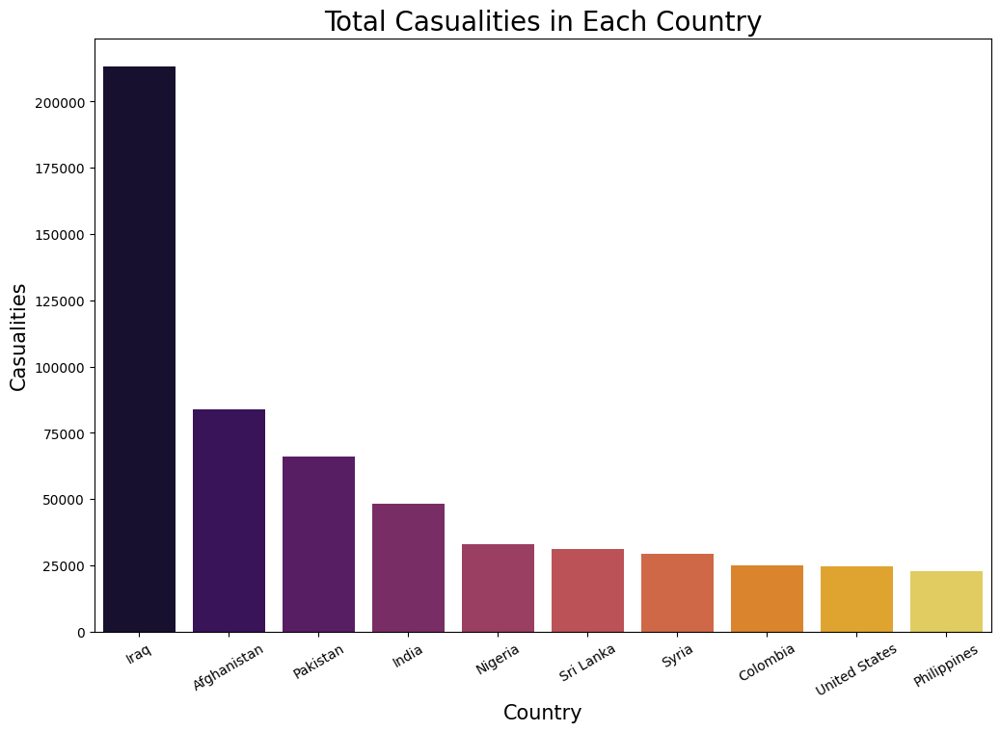

In [19]:
plt.subplots(figsize=(12,8))
cnt_cas = df.groupby('Country').casualities.sum().to_frame().reset_index().sort_values('casualities', ascending=False)[:10]
sns.barplot(x=cnt_cas.Country, y=cnt_cas.casualities, palette= 'inferno')
plt.xticks(rotation=30)
plt.xlabel("Country", size=15)
plt.ylabel("Casualities", size=15)
plt.title('Total Casualities in Each Country', size=20)
plt.show()

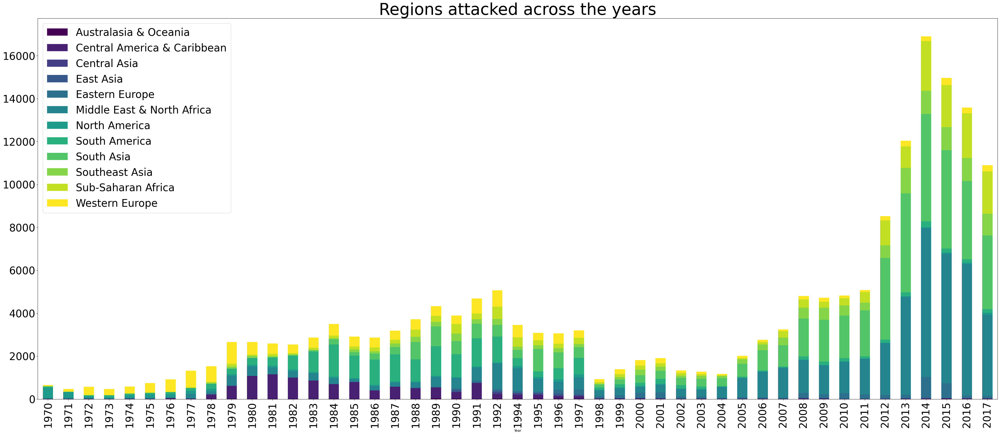

In [20]:
df1 = df.groupby(['Region', 'Year']).size().reset_index().pivot(columns='Region', index='Year', values=0)
df1.plot(kind = 'bar', stacked = True, figsize = (50,20), colormap = 'viridis')
plt.legend(loc=2, prop = {'size':30})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.title("Regions attacked across the years", fontsize = 47)
plt.show()

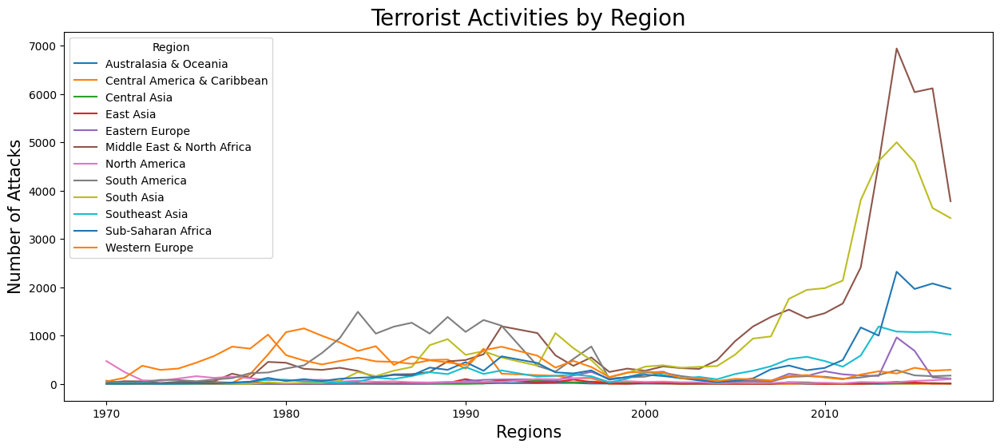

In [21]:
pd.crosstab(df.Year, df.Region).plot(kind='line',figsize=(15,6))
plt.title('Terrorist Activities by Region', size=20)
plt.xlabel('Regions', size=15)
plt.ylabel('Number of Attacks', size=15)
plt.show()

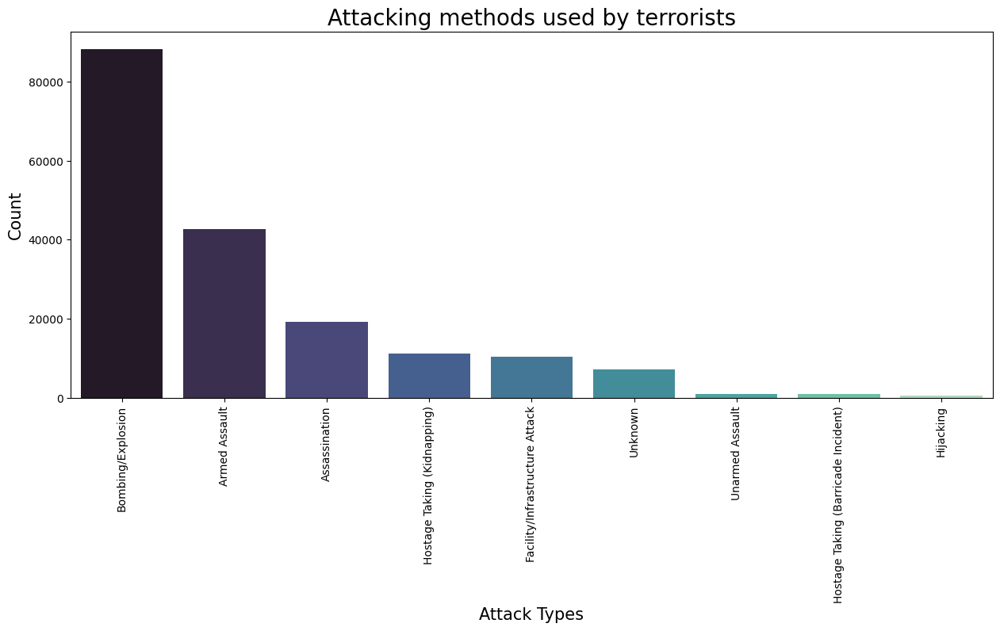

In [22]:
plt.subplots(figsize=(15,6))
sns.barplot(x=df['AttackType'].value_counts().index, y=df['AttackType'].value_counts().values,palette='mako')
plt.title('Attacking methods used by terrorists', size=20)
plt.xlabel('Attack Types', size=15)
plt.ylabel('Count', size=15)
plt.xticks(rotation= 90)
plt.show()

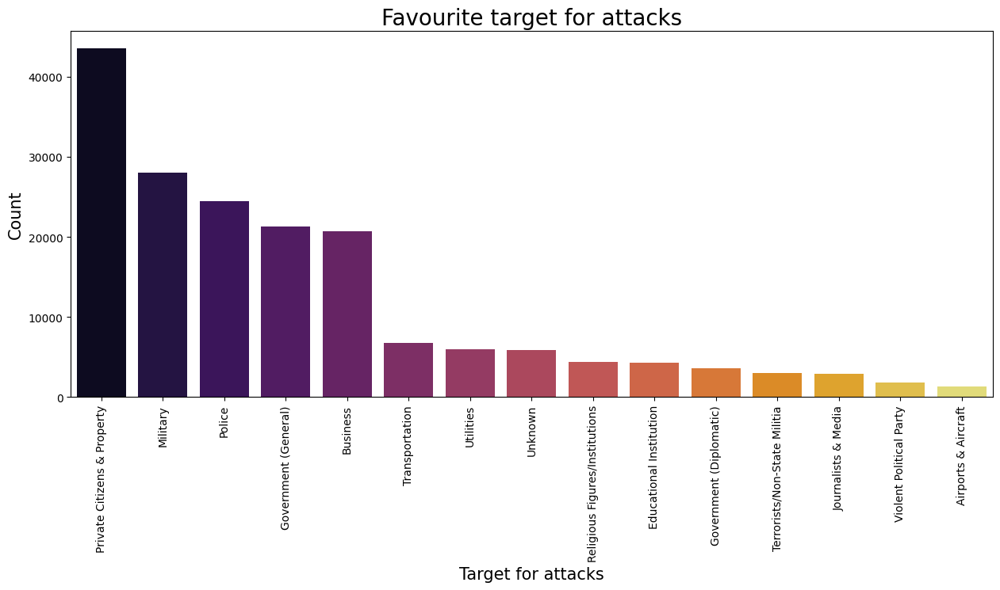

In [23]:
plt.subplots(figsize=(15,6))
sns.barplot(x=df['Target_type'].value_counts()[:15].index, y=df['Target_type'].value_counts()[:15].values,palette='inferno')
plt.title('Favourite target for attacks', size=20)
plt.xlabel('Target for attacks', size=15)
plt.ylabel('Count', size=15)
plt.xticks(rotation= 90)
plt.show()

Text(0.5, 1.0, 'Attacks by Terrorist Groups')

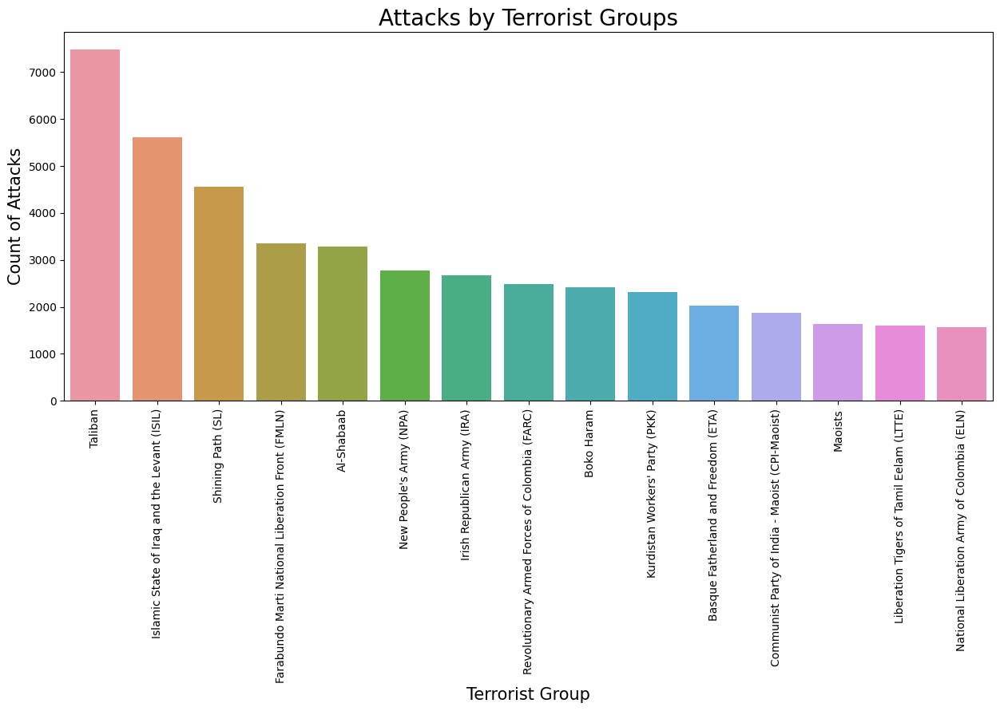

In [24]:
Name = df[df['Group'] == 'Unknown'].index
df.drop(Name , inplace=True)
plt.subplots(figsize=(15,6))
sns.barplot(x=df['Group'].value_counts().index[:15], y=df['Group'].value_counts().values[:15])
plt.xlabel("Terrorist Group", size=15)
plt.ylabel("Count of Attacks", size=15)
plt.xticks(rotation=90)
plt.title('Attacks by Terrorist Groups',size=20)

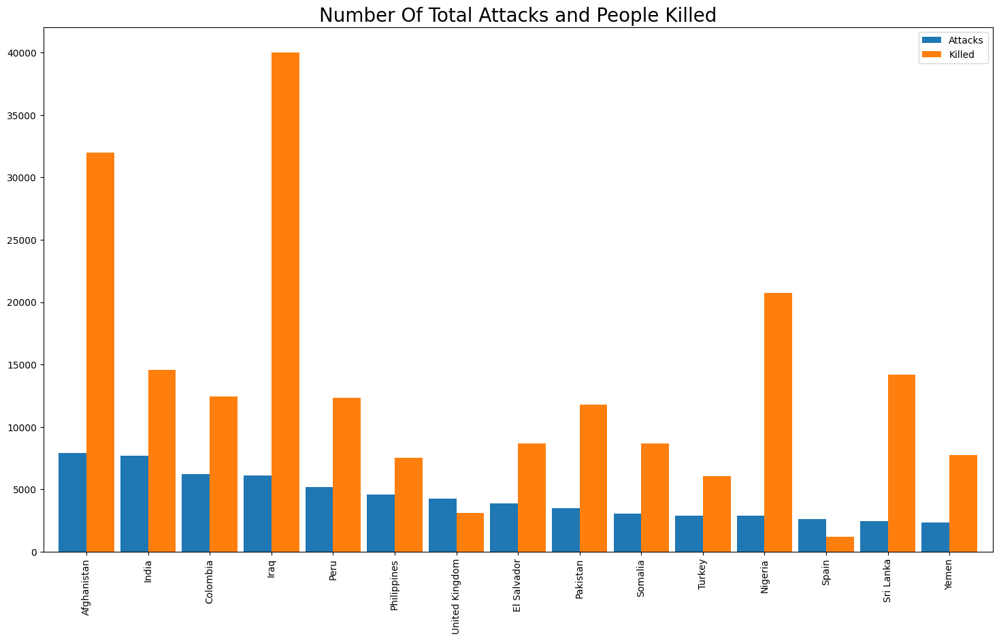

In [25]:
count = df['Country'].value_counts()[:15].to_frame()
count.columns=['Attacks']
df1=df.groupby('Country')['Killed'].sum().to_frame()
count.merge(df1,left_index=True,right_index=True,how='left').plot.bar(width=0.9)
fig=plt.gcf()
fig.set_size_inches(18,10)
plt.title('Number Of Total Attacks and People Killed', size=20)
plt.show()

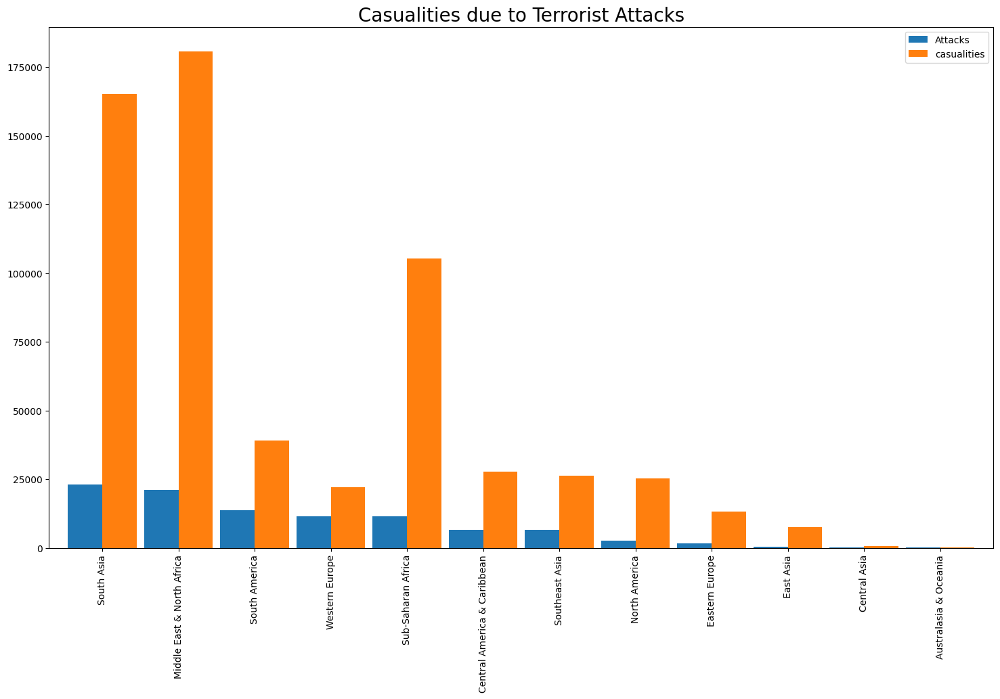

In [26]:
count = df['Region'].value_counts()[:15].to_frame()
count.columns=['Attacks']
df1=df.groupby('Region')['casualities'].sum().to_frame()
count.merge(df1,left_index=True,right_index=True,how='left').plot.bar(width=0.9)
fig=plt.gcf()
fig.set_size_inches(18,10)
plt.title('Casualities due to Terrorist Attacks', size=20)
plt.show()

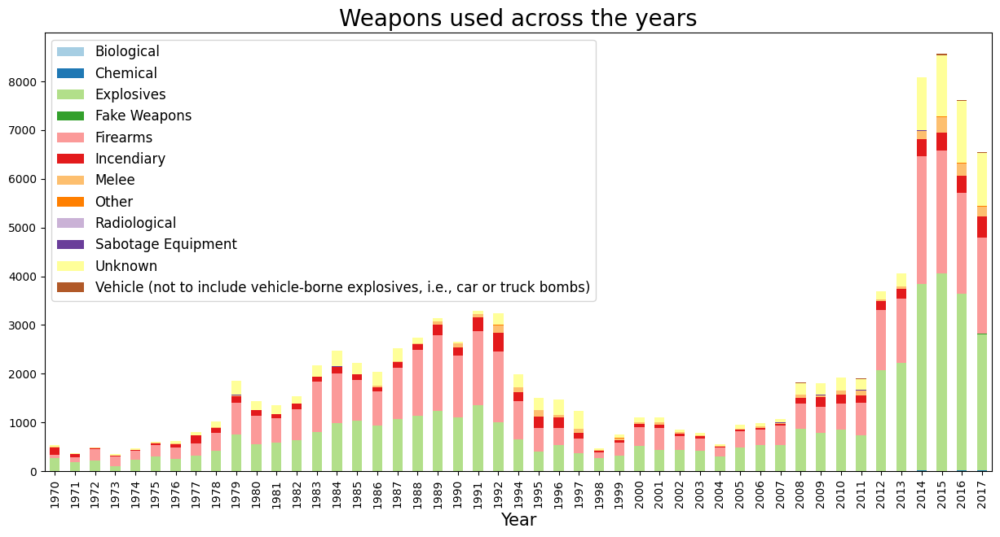

In [27]:
df2 = df.groupby(['Weapon_type', 'Year']).size().reset_index().pivot(columns='Weapon_type', index='Year', values=0)
df2.plot(kind = 'bar', stacked = True, figsize = (15,7), colormap = 'Paired')
plt.legend(loc=2, prop = {'size':12})
plt.xlabel("Year", size=15)
plt.title("Weapons used across the years", size=20)
plt.show()

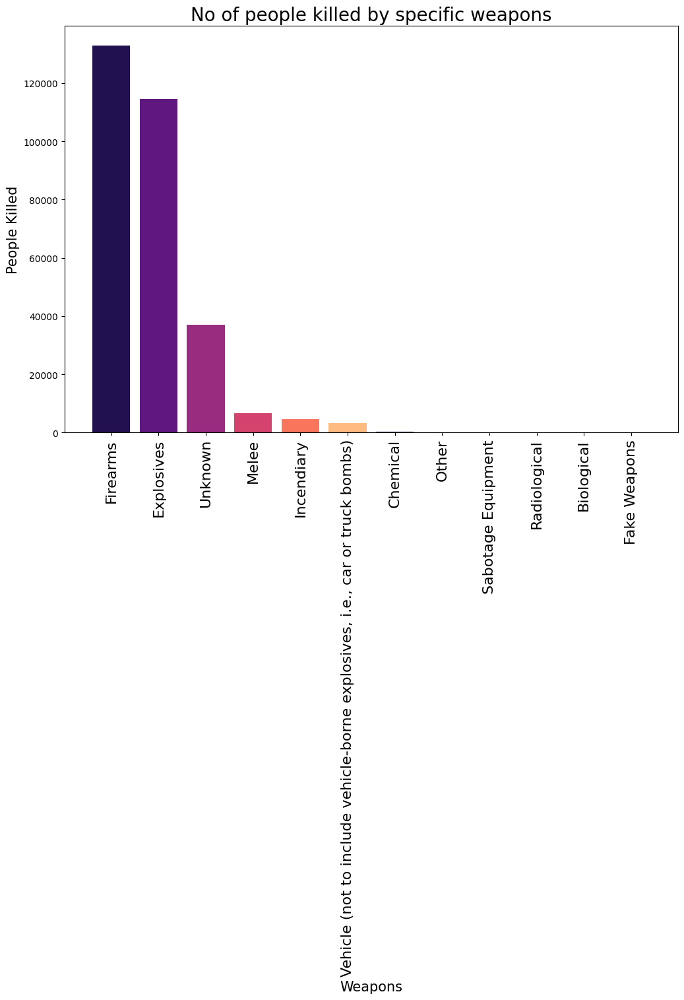

In [28]:
df3 = df[['Weapon_type','Killed']].groupby(by = 'Weapon_type').sum().sort_values('Killed', ascending=False)
plt.figure(figsize = (12,8))
plt.bar(x = df3.index, height = df3['Killed'], color = sns.color_palette('magma'))
plt.xticks(fontsize = 16, rotation = 90)
plt.xlabel('Weapons', size=15)
plt.ylabel("People Killed", size=15)
plt.title("No of people killed by specific weapons", size=20)
plt.show()

Map of Terrorist Attacks in 2015

In [29]:
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster, Fullscreen, MiniMap, HeatMap, HeatMapWithTime

In [30]:
filterYear = df['Year'] == 2015
df1 = df[filterYear]
FilterData = df1.loc[:,'City':'longitude']
FilterData = FilterData.dropna()
FilterDataList = FilterData.values.tolist()

map = folium.Map(location = [0, 30], tiles='CartoDB positron', zoom_start=2)
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(FilterDataList)):
    folium.Marker(location=[FilterDataList[point][1],FilterDataList[point][2]],
                  popup = FilterDataList[point][0]).add_to(markerCluster)
map


Tracking Terrorist Attacks Over Time using Heatmap

In [31]:
year_list = []
for year in df['Year'].sort_values().unique():
    data = df.query('Year == @year')
    data = data.groupby(by=['latitude', 'longitude'],
                        as_index=False).count().sort_values(by='EventId', ascending=False).iloc[:, :3]
    year_list.append(data.values.tolist())

m = folium.Map(
    location=[0, 0],
    zoom_start=2.0,

)

HeatMapWithTime(
    name='Terrorism Heatmap',
    data=year_list,
    radius=9,
    index=list(df['Year'].sort_values().unique())
).add_to(m)
m.save('terrorism_density_year.html')
m

Saving the cleaned data for Data Visualization in Tableau

Tableau Public Link:- https://public.tableau.com/views/GTD_final/GTDDashboard?:language=en-US&:display_count=n&:origin=viz_share_link

In [32]:
df.to_excel('Terrorism_Analysis.xlsx')


## Predictive analysis

### 1. Predicting Casualties

Can the number of casualities be predicted from other factors.

In [33]:
df = pd.read_csv(io.BytesIO(uploaded['globalterrorismdb_0718dist.csv']),encoding='ISO-8859-1')

<ipython-input-33-9751ba79bec8>:1: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(io.BytesIO(uploaded['globalterrorismdb_0718dist.csv']),encoding='ISO-8859-1')


In [34]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [35]:
df.shape

(181691, 135)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [37]:
# Renaming the columns and using only those columns that are useful for visualisation
df.rename(columns={'eventid':'EventId','iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'State',
                   'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                   'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                   'weaptype1_txt':'Weapon_type','motive':'Motive','city':'City', 'natlty1_txt':'Nationality',
                   'success':'Success'},inplace=True)

df=df[['EventId','Year','Month','Day','Country','State','Region','City','latitude','longitude','AttackType',
             'Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive','Nationality','Success']]

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 21 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   EventId      181691 non-null  int64  
 1   Year         181691 non-null  int64  
 2   Month        181691 non-null  int64  
 3   Day          181691 non-null  int64  
 4   Country      181691 non-null  object 
 5   State        181270 non-null  object 
 6   Region       181691 non-null  object 
 7   City         181257 non-null  object 
 8   latitude     177135 non-null  float64
 9   longitude    177134 non-null  float64
 10  AttackType   181691 non-null  object 
 11  Killed       171378 non-null  float64
 12  Wounded      165380 non-null  float64
 13  Target       181055 non-null  object 
 14  Summary      115562 non-null  object 
 15  Group        181691 non-null  object 
 16  Target_type  181691 non-null  object 
 17  Weapon_type  181691 non-null  object 
 18  Motive       50561 non-n

In [38]:
cols = ["EventId","Year","Month","Day","Success"]
df[cols] = df[cols].apply(pd.to_numeric, errors='coerce', axis=1)

cols1 = ["latitude","longitude","Killed","Wounded"]
df[cols1] = df[cols1].apply(pd.to_numeric, errors='coerce', axis=1)

In [39]:
df.head()

,EventId,Year,Month,Day,Country,State,Region,City,latitude,longitude,...,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,Nationality,Success
0,197000000001,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,...,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,Dominican Republic,1
1,197000000002,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,...,0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,Belgium,1
2,197001000001,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,...,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,United States,1
3,197001000002,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,...,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,United States,1
4,197001000003,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,...,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,United States,1


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 21 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   EventId      181691 non-null  int64  
 1   Year         181691 non-null  int64  
 2   Month        181691 non-null  int64  
 3   Day          181691 non-null  int64  
 4   Country      181691 non-null  object 
 5   State        181270 non-null  object 
 6   Region       181691 non-null  object 
 7   City         181257 non-null  object 
 8   latitude     177135 non-null  float64
 9   longitude    177134 non-null  float64
 10  AttackType   181691 non-null  object 
 11  Killed       171378 non-null  float64
 12  Wounded      165380 non-null  float64
 13  Target       181055 non-null  object 
 14  Summary      115562 non-null  object 
 15  Group        181691 non-null  object 
 16  Target_type  181691 non-null  object 
 17  Weapon_type  181691 non-null  object 
 18  Motive       50561 non-n

In [41]:
df.isnull().sum()

EventId             0
Year                0
Month               0
Day                 0
Country             0
State             421
Region              0
City              434
latitude         4556
longitude        4557
AttackType          0
Killed          10313
Wounded         16311
Target            636
Summary         66129
Group               0
Target_type         0
Weapon_type         0
Motive         131130
Nationality      1559
Success             0
dtype: int64

In [42]:
# filling the null for killed and wounded with median value of the column
df.Wounded=np.round(df.Wounded.fillna(df.Wounded.median())).astype('float64')
df.Killed=np.round(df.Killed.fillna(df.Killed.median())).astype('float64')

df.EventId=np.round(df.EventId.fillna(df.EventId.median())).astype('int64')
df.Year=np.round(df.Year.fillna(df.Year.median())).astype('int64')
df.Month=np.round(df.Month.fillna(df.Month.median())).astype('int64')
df.Day=np.round(df.Day.fillna(df.Day.median())).astype('int64')

#creating a new column casualities and casuality_class --> which is of type binary i.e. 0 and 1
df['Casualities'] = df['Killed']+ df['Wounded']
df['Casuality_class'] = df.Casualities.apply(lambda x: 0 if x == 0 else 1)

df["latitude"] = df["latitude"].fillna(0.0)
df["longitude"] = df["longitude"].fillna(0.0)

df["Success"] = df["Success"].fillna(0)
df.head(5)

,EventId,Year,Month,Day,Country,State,Region,City,latitude,longitude,...,Target,Summary,Group,Target_type,Weapon_type,Motive,Nationality,Success,Casualities,Casuality_class
0,197000000001,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,...,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,Dominican Republic,1,1.0,1
1,197000000002,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,...,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,Belgium,1,0.0,0
2,197001000001,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,...,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,United States,1,1.0,1
3,197001000002,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,...,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,United States,1,0.0,0
4,197001000003,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,...,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,United States,1,0.0,0


In [43]:
# converts all the columns of the dataframe df that are of type 'object' to categorical variables.
features = df.dtypes[df.dtypes == 'object'].index
for col in features:
    df[col] = df[col].astype('category')
    df[col] = pd.factorize(df[col])[0]

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 23 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   EventId          181691 non-null  int64  
 1   Year             181691 non-null  int64  
 2   Month            181691 non-null  int64  
 3   Day              181691 non-null  int64  
 4   Country          181691 non-null  int64  
 5   State            181691 non-null  int64  
 6   Region           181691 non-null  int64  
 7   City             181691 non-null  int64  
 8   latitude         181691 non-null  float64
 9   longitude        181691 non-null  float64
 10  AttackType       181691 non-null  int64  
 11  Killed           181691 non-null  float64
 12  Wounded          181691 non-null  float64
 13  Target           181691 non-null  int64  
 14  Summary          181691 non-null  int64  
 15  Group            181691 non-null  int64  
 16  Target_type      181691 non-null  int6

In [45]:
from sklearn.model_selection import train_test_split

Features = ['Year','Month','Day','Country','State','Region','City','latitude','longitude','AttackType','Group','Target_type','Weapon_type','Success']

X = df[Features]
Y = df['Casualities']

Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, Y, test_size=0.25,random_state = 43)

print(Xtrain.shape)
print(Xtest.shape)

(136268, 14)
(45423, 14)


In [46]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=20,
                              random_state=0)

forest.fit(X, Y)
importances = forest.feature_importances_
print(forest.feature_importances_)

[0.10499093 0.10973451 0.14516514 0.03169032 0.05725555 0.02241628
 0.08441257 0.0887648  0.08847069 0.0771446  0.04434191 0.07914086
 0.04752041 0.01895143]


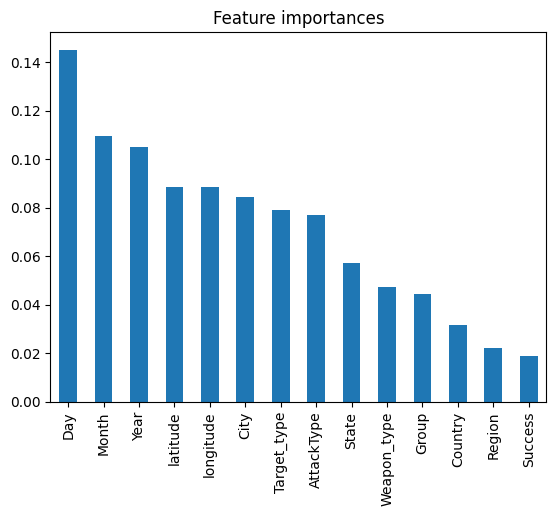

In [47]:
plt.figure()
plt.title("Feature importances")
feat_importances = pd.Series(forest.feature_importances_, index=X.columns)
feat_importances.nlargest(16).plot(kind='bar')
plt.show()

In [49]:
feature_final = ['Year','Month','Day','City','latitude','longitude','AttackType','City','Target_type']
X = df[feature_final]

In [50]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25)

In [51]:
model = RandomForestClassifier(n_estimators=20)
model.fit(Xtrain, Ytrain)
Ypred = model.predict(Xtest)
np.mean(Ypred == Ytest)

0.5087070426876252

Predicting Casualties
The initial analysis focused on predicting the number of casualties from factors such as date, month, year, city, attack type, and target type. These features were selected after a rigorous feature selection process. The data was cleaned, null values were filled, and all object types were converted to categorical data. A Random Forest Classifier was used for the prediction model.
However, the model's accuracy was only 51%, indicating that it was challenging to predict the number of casualties based on the selected features. This could be due to the inherent randomness and unpredictability of terrorist attacks, which makes it difficult to accurately predict the number of casualties based on the available data.

### 2. Predicting Attack Success

Can the attack success be predicted from the available factors.

Given the low accuracy of the casualty prediction model, the focus of the analysis will be shifted to predicting whether an attack would be successful or not.

In [52]:
from sklearn.model_selection import train_test_split

Features = ['AttackType','Group','Target_type','Weapon_type','Wounded','Killed']

X = df[Features]
Y = df['Success']

Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, Y, test_size=0.25,random_state = 43)

print(Xtrain.shape)
print(Xtest.shape)

(136268, 6)
(45423, 6)


In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=20,
                              random_state=0)

forest.fit(X, Y)
importances = forest.feature_importances_
print(forest.feature_importances_)

[0.09357855 0.20809536 0.22442484 0.05971019 0.15667366 0.2575174 ]


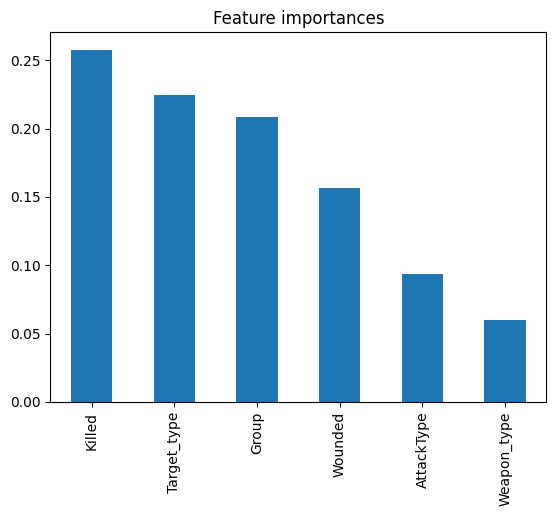

In [54]:
plt.figure()
plt.title("Feature importances")
feat_importances = pd.Series(forest.feature_importances_, index=X.columns)
feat_importances.nlargest(16).plot(kind='bar')
plt.show()

In [55]:
feature_final = ['Killed','Target_type','Group']
X = df[feature_final]

In [56]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25)

In [57]:
model = RandomForestClassifier(n_estimators=20)
model.fit(Xtrain, Ytrain)
Ypred = model.predict(Xtest)
np.mean(Ypred == Ytest)

0.9195561719833565

In [58]:
# prompt: validation with K-fold for above

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kfold = KFold(n_splits=10, shuffle=True, random_state=0)
results = cross_val_score(model, X, Y, cv=kfold)
print("Accuracy: %.3f%%" % (results.mean()*100))


Accuracy: 90.042%


The model's accuracy improved significantly with this change in focus, achieving an accuracy of 91.95%. After performing k-fold validation, the accuracy remained high at 90.04%

The results of this analysis highlight the challenges and opportunities in using predictive analysis for understanding and anticipating terrorist activities. While predicting the number of casualties proved difficult, the ability to predict attack success could still provide valuable insights for counter-terrorism efforts.

For the visualization of Hot zones of attacks.    
Tableau Public Link:- https://public.tableau.com/views/GTD_final/GTDDashboard?:language=en-US&:display_count=n&:origin=viz_share_link